# 1. Import modules and load MERFISH data 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

import matplotlib.pyplot as plt

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

# 2. Load MERLin analysis results

In [2]:
merlin_output_folder = r'I:\MERFISH_Analysis\20220312-P_brain_M1_adaptors'
#merlin_output_folder = r'I:\MERFISH_Analysis\Test\20220303-P_brain_M1_nonclear_test'
# generate post-analysis folders
#postanalysis_folder = merlin_output_folder+'_PostAnalysis'
postanalysis_folder = os.path.join(merlin_output_folder, 'PostAnalysis')
if not os.path.exists(postanalysis_folder):
    print(f"Create postanalysis_folder: {postanalysis_folder}")
    os.makedirs(postanalysis_folder)
else:
    print(f"Use postanalysis_folder: {postanalysis_folder}")

Use postanalysis_folder: I:\MERFISH_Analysis\20220312-P_brain_M1_adaptors\PostAnalysis


In [3]:
# Load Cell information
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,102628079785516227894784115188338249099,0,232.742418,-9090.119800,1632.064028,-9096.070600,-9084.169000,1627.517227,1636.610828
1,104156011122455011356453981180543153680,0,7.316128,-9070.031800,1619.536027,-9071.230600,-9068.833000,1618.445227,1620.626827
2,10578312836209458752786967985982022336,0,223.002978,-9090.551800,1553.386025,-9094.558600,-9086.545000,1548.569225,1558.202826
3,110607710355855320902246028318800301355,0,484.025232,-9193.745803,1601.230027,-9199.210603,-9188.281003,1596.737227,1605.722827
4,114386308142406625966667008296510046460,0,46.863972,-9171.443802,1652.800028,-9176.314602,-9166.573002,1649.117228,1656.482828
...,...,...,...,...,...,...,...,...,...
19268,77083872029867876073800012132946170208,172,428.360072,3553.930098,-2919.303996,3549.329298,3558.530898,-2929.898796,-2908.709196
19269,77215116979388541258866554263188225225,172,23.158173,3736.180103,-2901.483996,3733.901303,3738.458903,-2903.978796,-2898.989195
19270,84953092370032313222897605918819718013,172,88.030429,3626.290100,-2979.675998,3623.309300,3629.270900,-2982.386798,-2976.965197
19271,85104309251391436263380956494273649801,172,211.207407,3642.436101,-2880.045995,3638.321300,3646.550901,-2884.970795,-2875.121195


In [4]:
# Load decoded counts information
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')
#blanks = [f'Blank-{i}' for i in range(1, 11)]
for _c in df.columns:
    if 'Blank-' in _c:
        df = df.drop(columns=_c)
adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

In [5]:
df

,1700022I11Rik,1810046K07Rik,5031425F14Rik,5730522E02Rik,Acta2,Adam2,Adamts2,Adamts4,Adra1b,Alk,...,Unc13c,Unc5b,Unc5d,Ust,Vipr2,Vtn,Vwc2,Wipf3,Wnt7b,Zfp804b
index,,,,,,,,,,,,,,,,,,,,,
102628079785516227894784115188338249099,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
104156011122455011356453981180543153680,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10578312836209458752786967985982022336,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
110607710355855320902246028318800301355,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
114386308142406625966667008296510046460,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77083872029867876073800012132946170208,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,...,0.0,3.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0
77215116979388541258866554263188225225,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
84953092370032313222897605918819718013,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# 4. Preprocess and filter the MERFISH data 

In [6]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

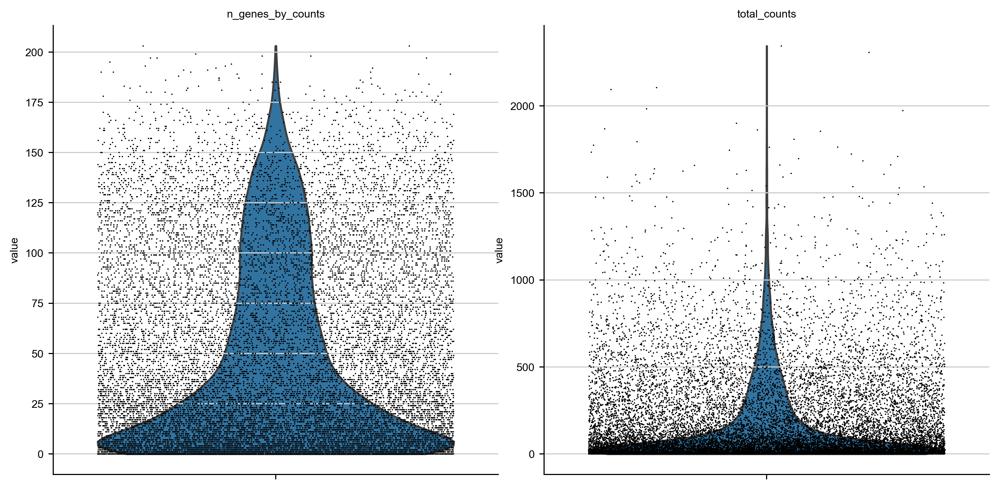

In [7]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

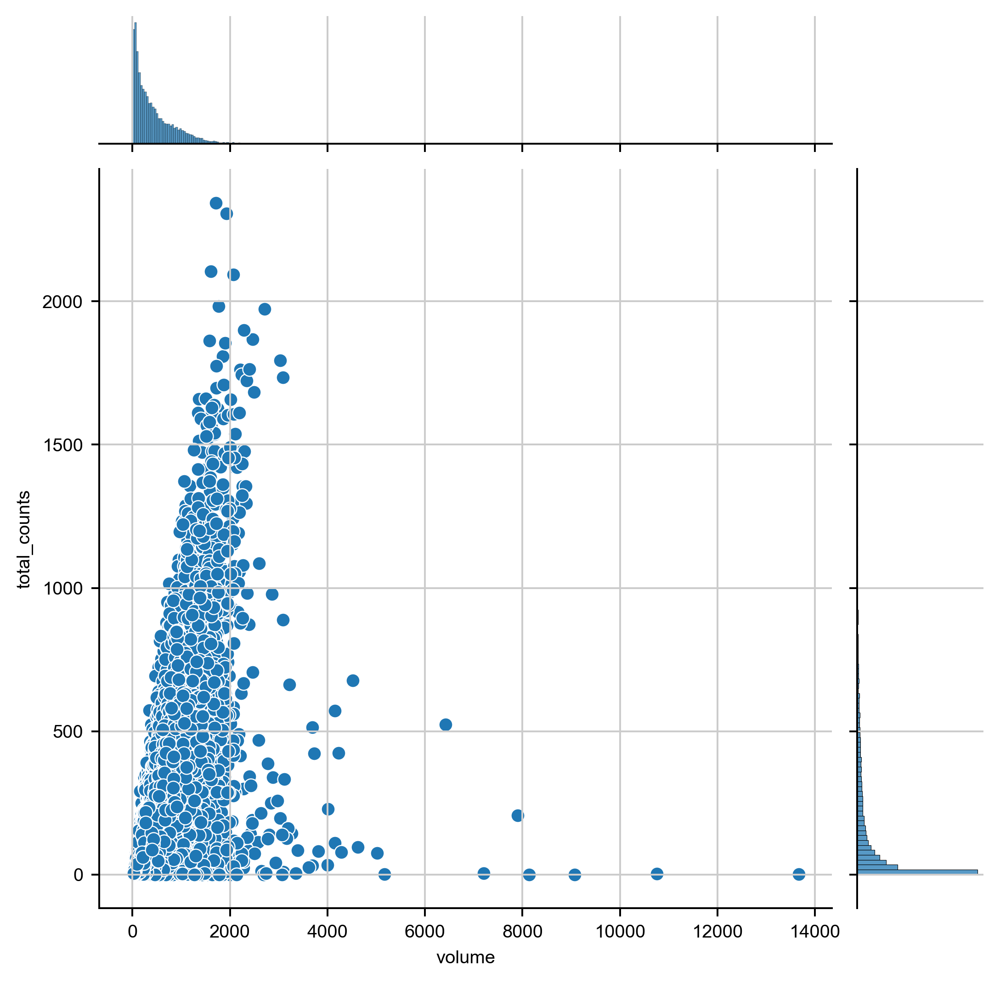

In [8]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts')

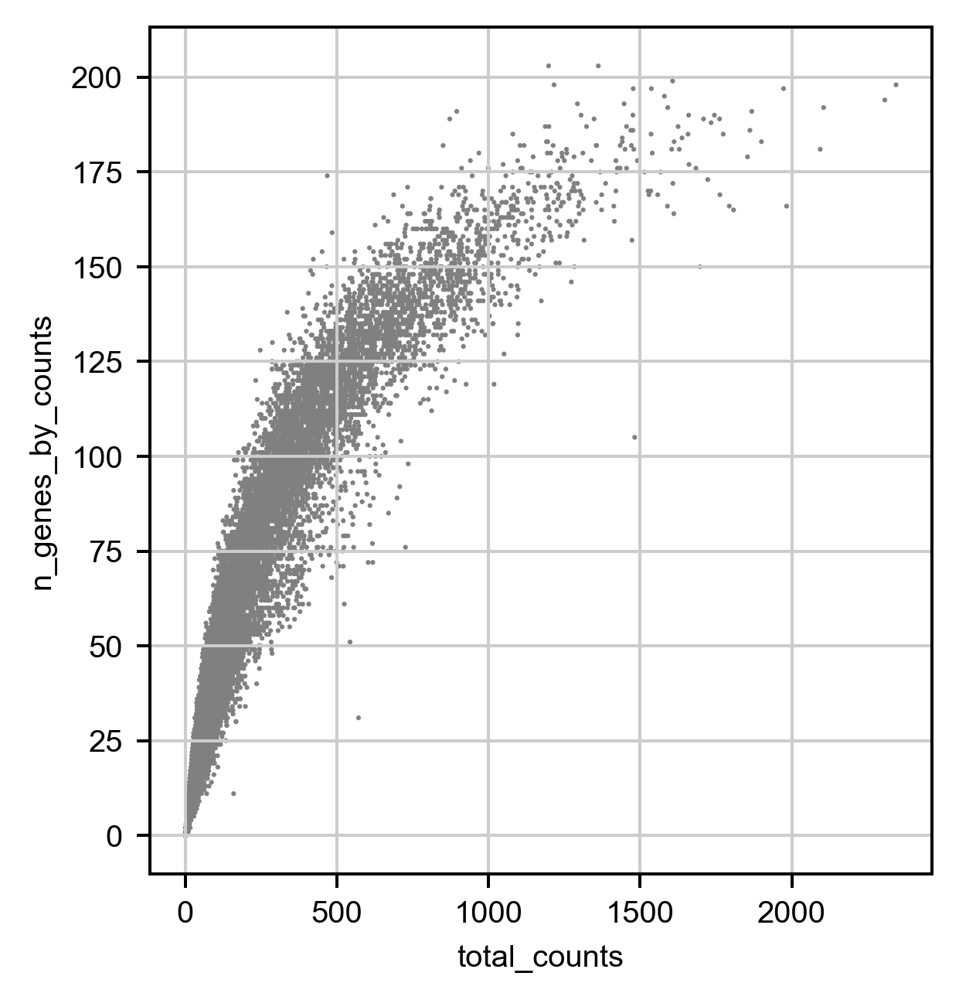

In [9]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [10]:
gene_count_threshold = 20
total_count_threshold = 20
volume_threshold = 100

# Filtering
adata = adata[adata.obs['n_genes_by_counts'] > gene_count_threshold]
adata = adata[adata.obs['total_counts'] > total_count_threshold]
adata = adata[adata.obs['volume'] > volume_threshold]

print(len(adata) / len(cell_meta_data) , len(adata))

0.5699683495044882 10985


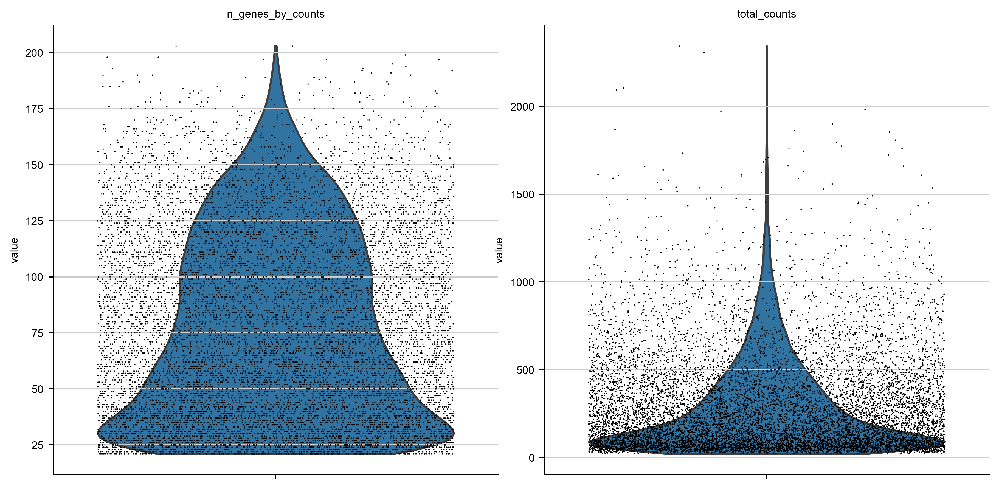

In [11]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

In [12]:
np.mean(adata.obs['total_counts'])

294.7922668457031

## 4. PCA and UMAP of the MERFISH data (for quick test)

E:\Users\puzheng\AppData\anaconda3\envs\merlin_postanalysis\lib\site-packages\scanpy\preprocessing\_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


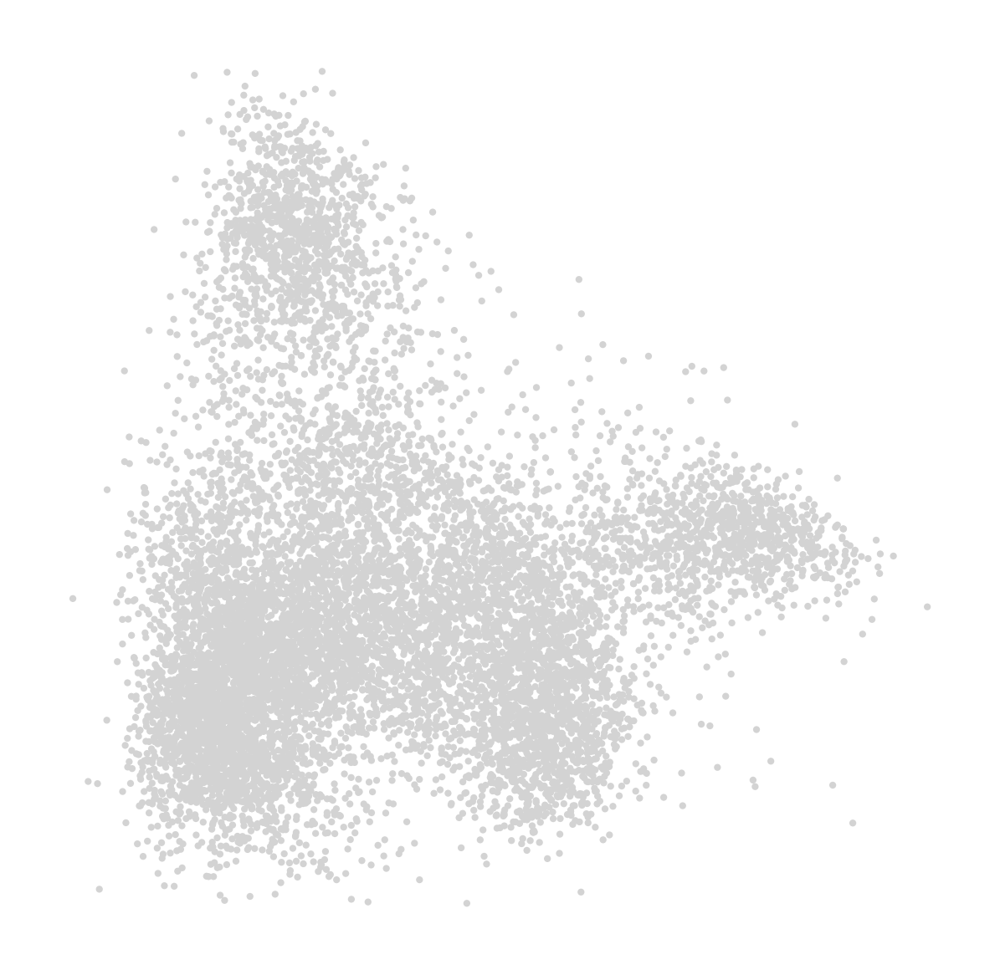

Wall time: 8.1 s


In [13]:
%%time
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [14]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

Wall time: 22.4 s


In [15]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=1)

Wall time: 1.2 s


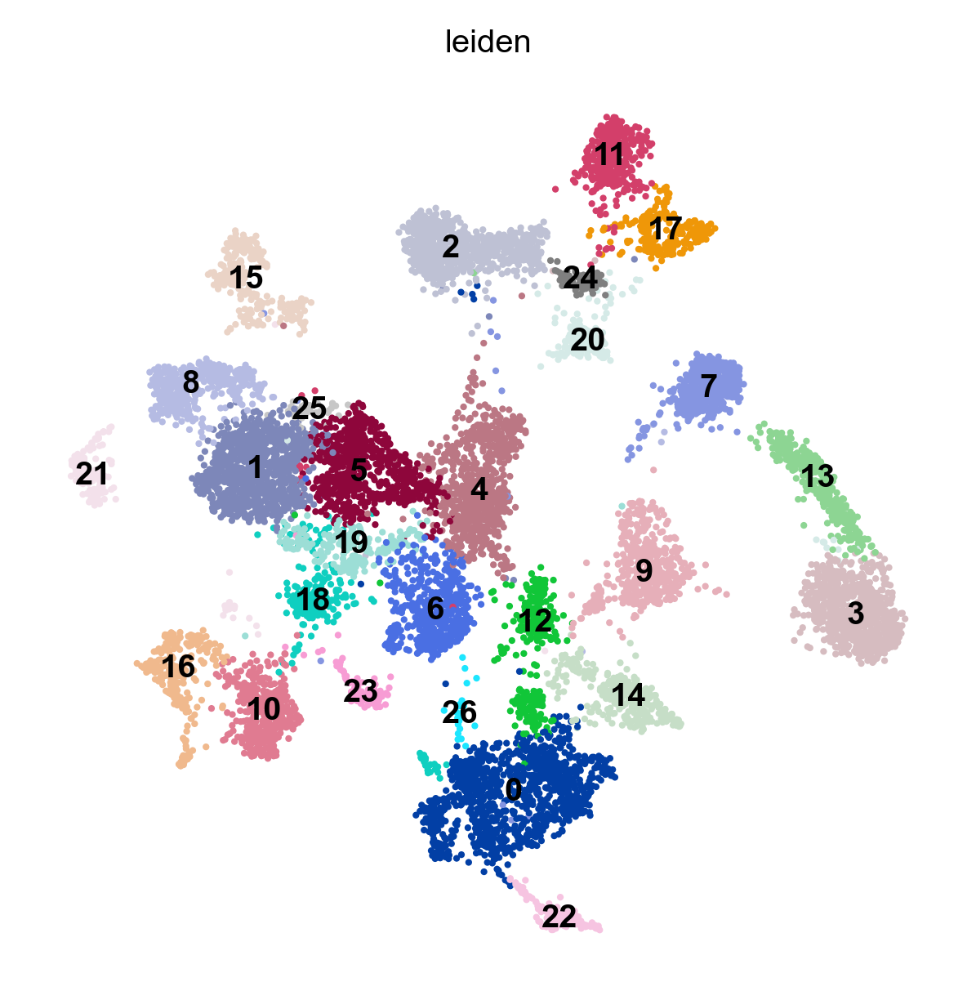

Wall time: 12.4 s


In [16]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

(-9901.037999805809, 4397.734298621118, -4391.356604963914, 2725.6127080325036)

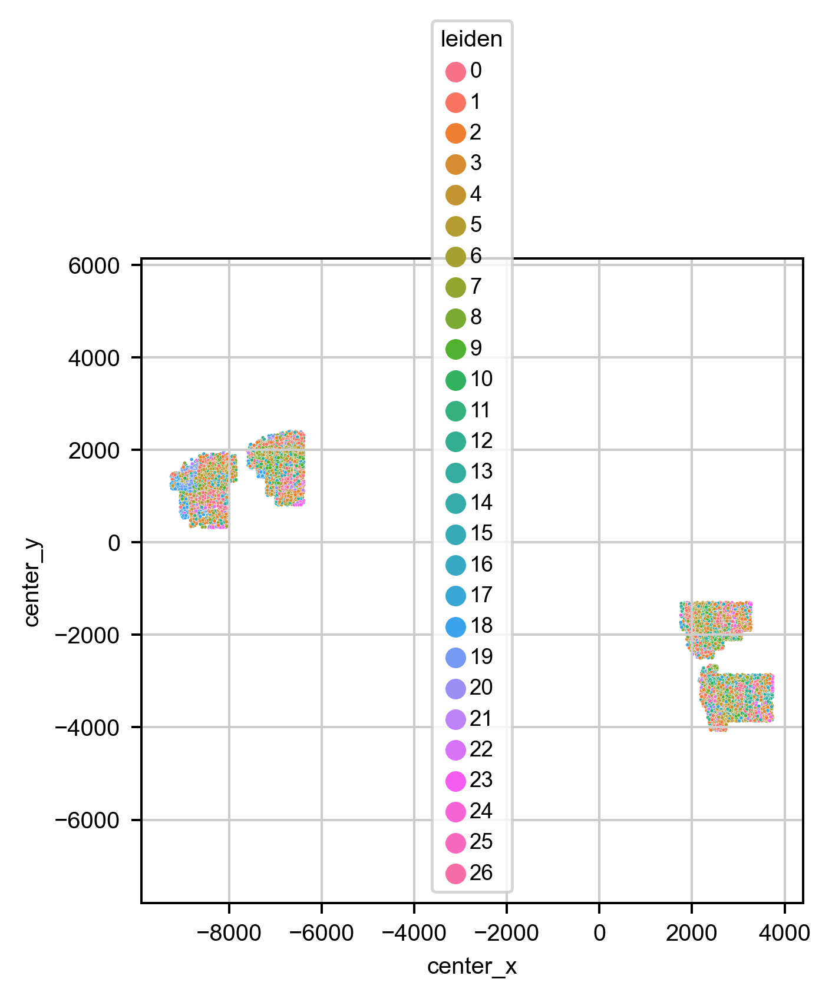

In [17]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
sns.scatterplot(data=adata.obs, x='center_x', y='center_y', hue='leiden', s=1.5)
plt.axis('equal')

## 5. Check count for each cell for genes of interest

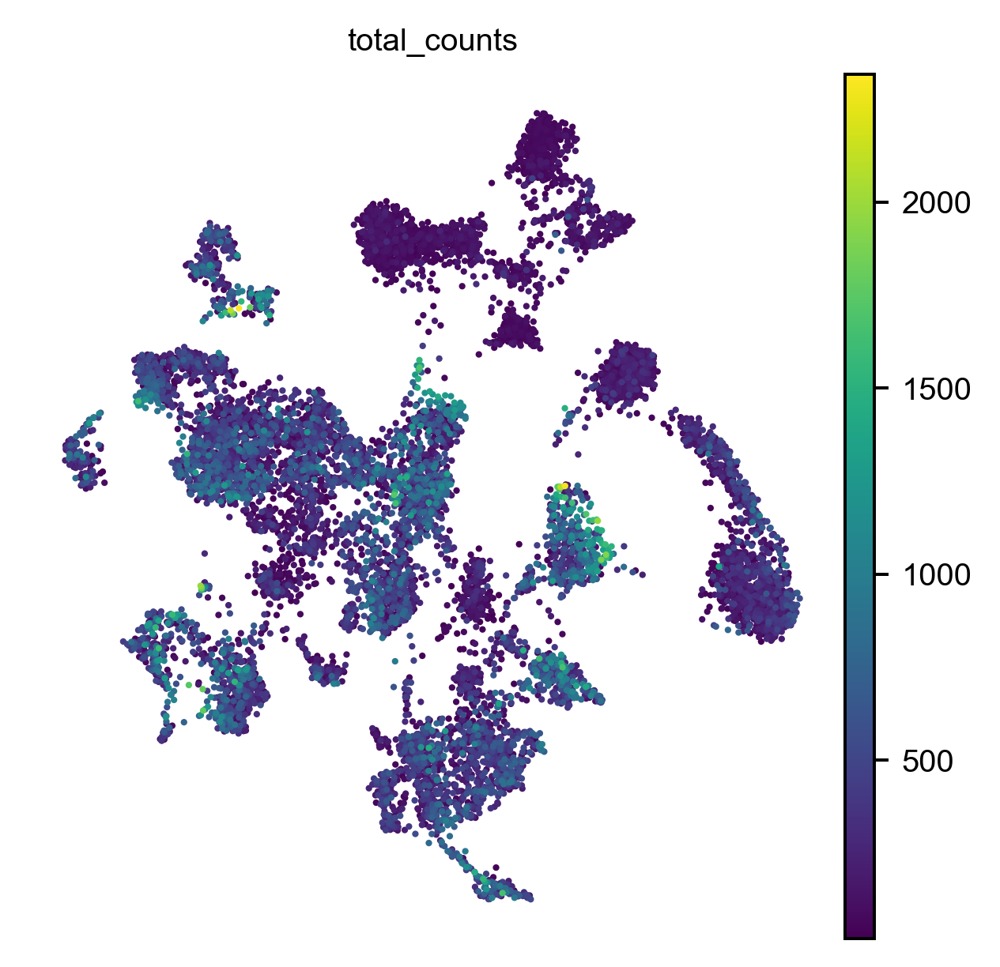

In [18]:
sc.pl.umap(adata, color='total_counts')

In [19]:
# load gene names
sel_gene_df = pd.read_excel(r'\\10.245.74.212\Chromatin_NAS_2\Chromatin_Libraries\CTP-12_mop_markers\smFISH_cell_class\MOP_marker_gene_readout.xlsx',
                          )
marker_genes = [_g for _g in sel_gene_df['Target gene'].values if (_g in adata.var.index)]
print(marker_genes)

['Slc30a3', 'Slc32a1', 'Otof', 'Rspo1', 'Sncg', 'Fam84b', 'Tshz2', 'Syt6', 'Nxph4', 'Cux2', 'Rorb', 'Sulf2', 'Ptpru', 'Car3', 'Aqp4', 'Flt1', 'Igf2', 'Pdgfra', 'Sox10', 'Ctss', 'Vtn', 'Bgn']


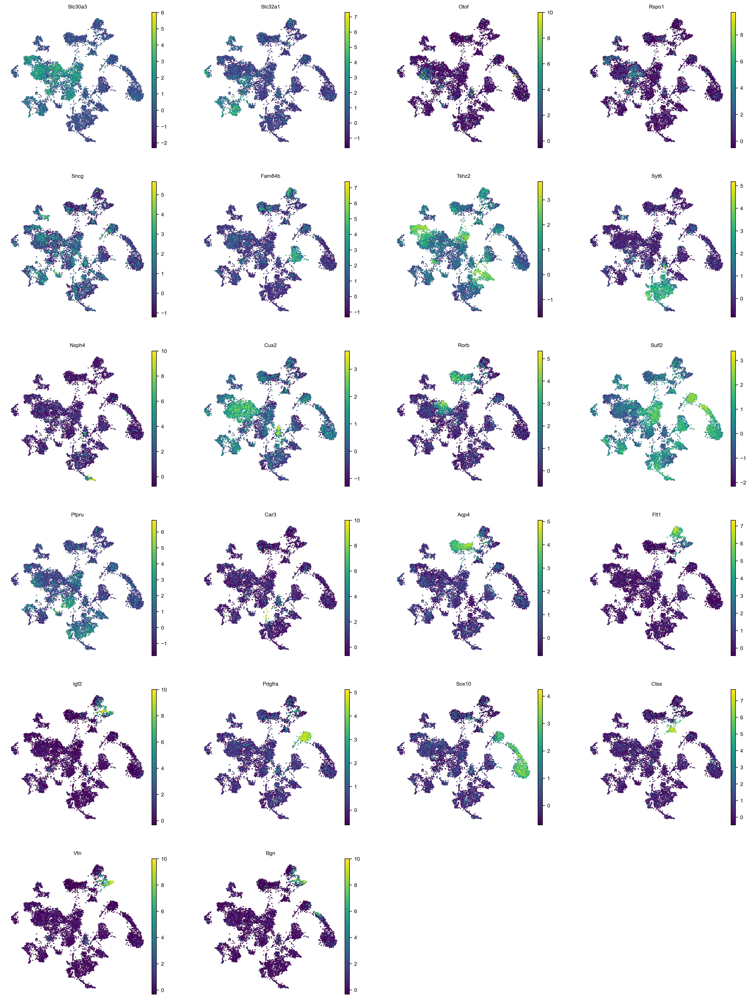

In [20]:
sc.pl.umap(adata, color=marker_genes)

## 6.UMAP can be done using different settings and can be saved into different label column for cell type classifer use later

## 6.1 Use higher expected pcs and resolution to UMAP for cell-type distinction at "cluster" level

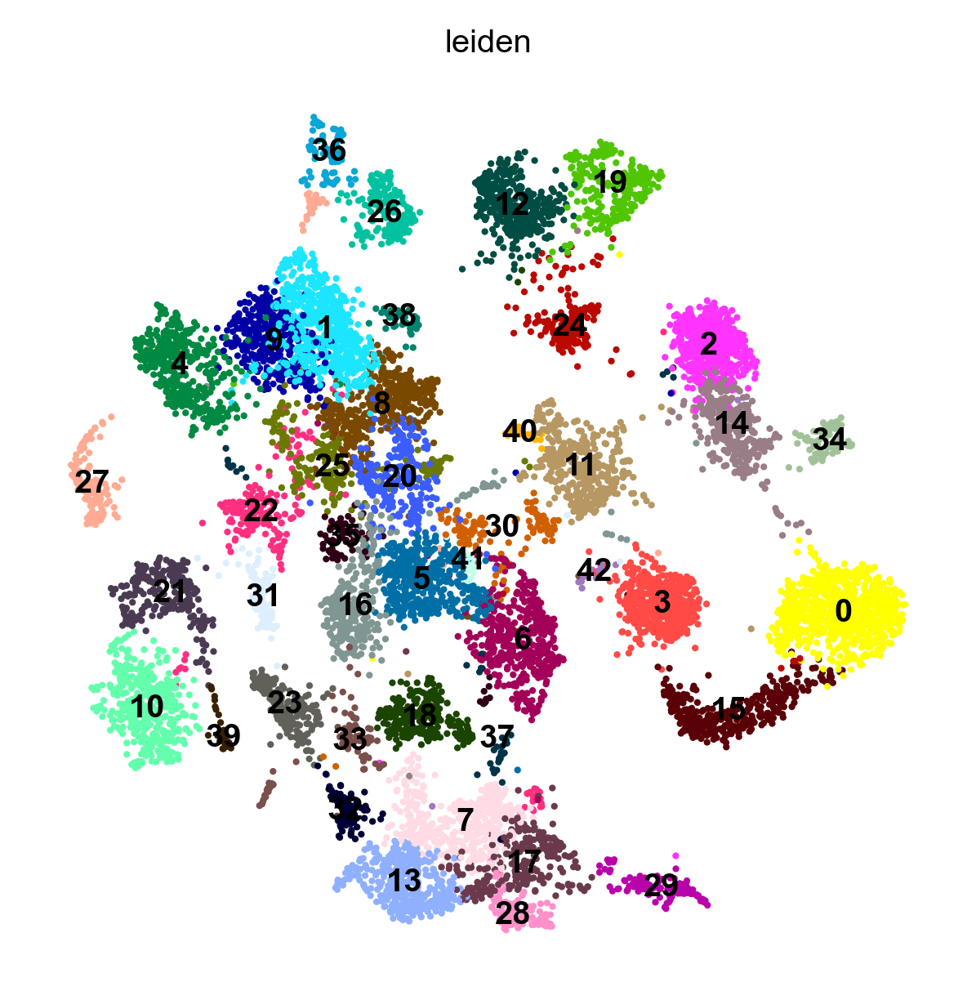

Wall time: 27.3 s


In [21]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=5, n_pcs=50)

sc.tl.leiden(adata, resolution=2)

sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# save this labels as a new column as 'leiden_cluster'
adata.obs['leiden_cluster'] = adata.obs.leiden

## 6.2 Use lower expected pcs and resolution to UMAP for cell-type distinction at subclass level

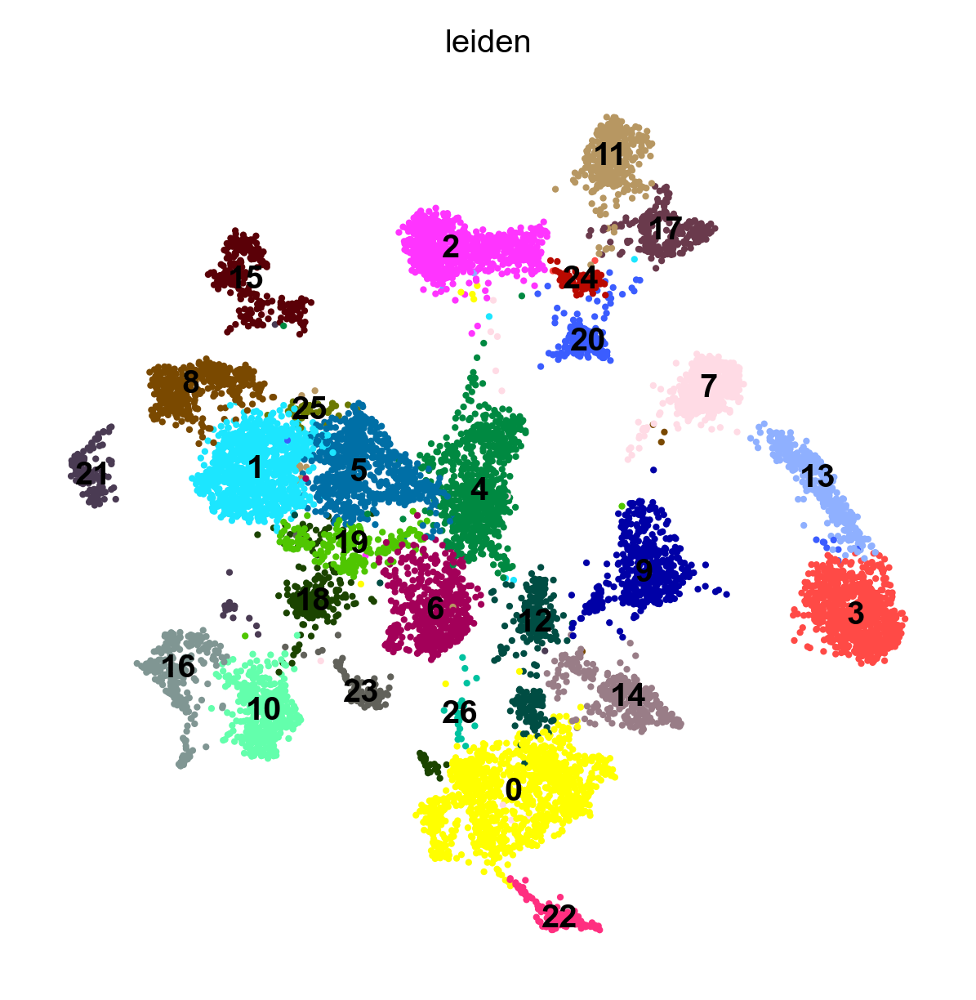

Wall time: 17 s


In [22]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)

sc.tl.leiden(adata, resolution=1)

sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

# save this new labels as a new column as 'leiden_subclass'
adata.obs['leiden_subclass'] = adata.obs.leiden

## 7. Save the analyzed MERFISH adata in h5ad for later use (e.g., cell classifer)

In [24]:
save_filename = os.path.join(os.path.join(postanalysis_folder, 'filtered_cluster_data.h5ad'))

overwrite = True

if not os.path.exists(save_filename) or overwrite:
    print(f"save adata into file: {save_filename}")
    adata.write(save_filename)
else:
    print(f"savefile: {save_filename} already exists")

save adata into file: I:\MERFISH_Analysis\20220312-P_brain_M1_adaptors\PostAnalysis\filtered_cluster_data.h5ad
